In [1]:
import pandas as pd

In [2]:
fold_df = pd.read_csv("D:\Kaggle Datasets\Datasets\Breast Cancer\Folds.csv")

In [3]:
fold_df.head()

,fold,mag,grp,filename
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...


In [4]:
fold_df['filename'][0]

'BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png'

In [5]:
fold_df = fold_df.rename(columns={"filename":"path"})
fold_df['filename'] = fold_df['path'].apply(lambda x: x.split('/')[-1])
fold_df['label'] = fold_df['path'].apply(lambda x: x.split('/')[3])

In [6]:
fold_df.head()

,fold,mag,grp,path,filename,label
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-001.png,benign
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-002.png,benign
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-003.png,benign
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-004.png,benign
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-005.png,benign


In [7]:
import os
os.makedirs('breast_cancer/')

"import os\nos.makedirs('breast_cancer/')"

In [8]:
# Moving all the files into a single folder for ease of use
import shutil

for index, row in fold_df.iterrows():
    src = "D:/Kaggle Datasets/Datasets/Breast Cancer/BreaKHis_v1/" + row['path']
    dest = "breast_cancer/"
    
    dest = os.path.join(dest,row['label']+'_'+row['filename'])
    
    shutil.copyfile(src,dest)

'# Moving all the files into a single folder for ease of use\nimport shutil\n\nfor index, row in fold_df.iterrows():\n    src = "D:/Kaggle Datasets/Datasets/Breast Cancer/BreaKHis_v1/" + row[\'path\']\n    dest = "breast_cancer/"\n    \n    dest = os.path.join(dest,row[\'label\']+\'_\'+row[\'filename\'])\n    \n    shutil.copyfile(src,dest)'

In [9]:
len(os.listdir('breast_cancer/'))

"len(os.listdir('breast_cancer/'))"

In [10]:
fold_df['file_loc'] = fold_df['label']+'_'+fold_df['filename']
fold_df['class'] = fold_df['label'].apply(lambda x: 0 if x=='benign' else 1)

In [11]:
fold_df.head()

,fold,mag,grp,path,filename,label,file_loc,class
0,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-001.png,benign,benign_SOB_B_A-14-22549AB-100-001.png,0
1,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-002.png,benign,benign_SOB_B_A-14-22549AB-100-002.png,0
2,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-003.png,benign,benign_SOB_B_A-14-22549AB-100-003.png,0
3,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-004.png,benign,benign_SOB_B_A-14-22549AB-100-004.png,0
4,1,100,train,BreaKHis_v1/histology_slides/breast/benign/SOB...,SOB_B_A-14-22549AB-100-005.png,benign,benign_SOB_B_A-14-22549AB-100-005.png,0


In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# The following lines are used for bypassing an error
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

<AxesSubplot:xlabel='label', ylabel='count'>

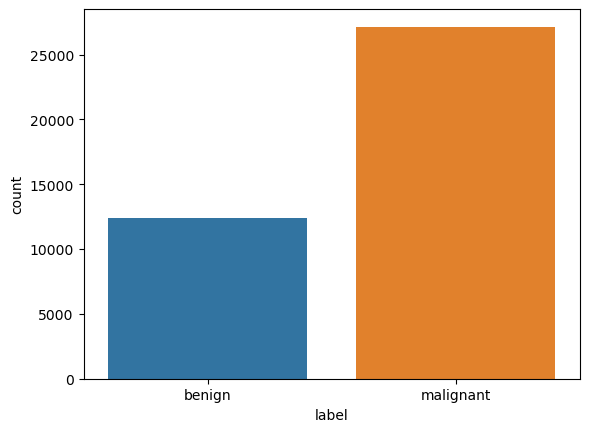

In [13]:
sns.countplot(x='label', data=fold_df)

In [14]:
benign_df = fold_df[fold_df['label'] == 'benign']
malignant_df = fold_df[fold_df['label'] == 'malignant']

Benign Sample

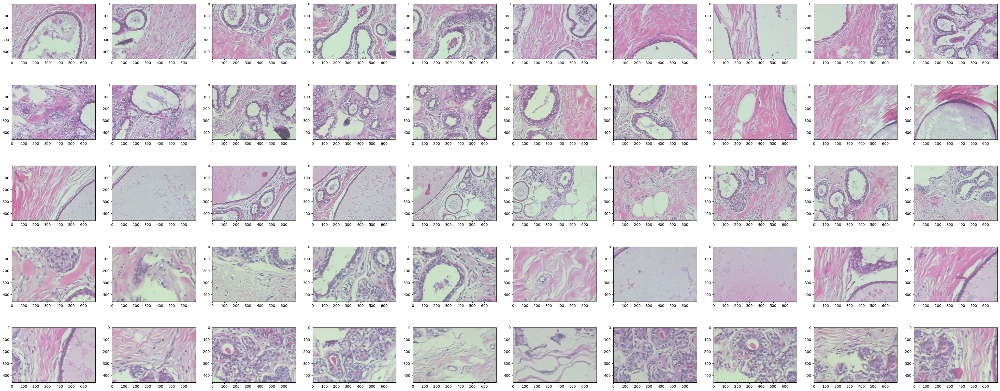

In [15]:
import matplotlib.image as mpimg

images_index = benign_df['file_loc'].values
plt.figure(figsize=(50,20))
for i in range(0,50):
    plt.subplot(5,10,i+1)
    img = mpimg.imread("breast_cancer/"+images_index[i])
    plt.imshow(img)

Malignant Sample

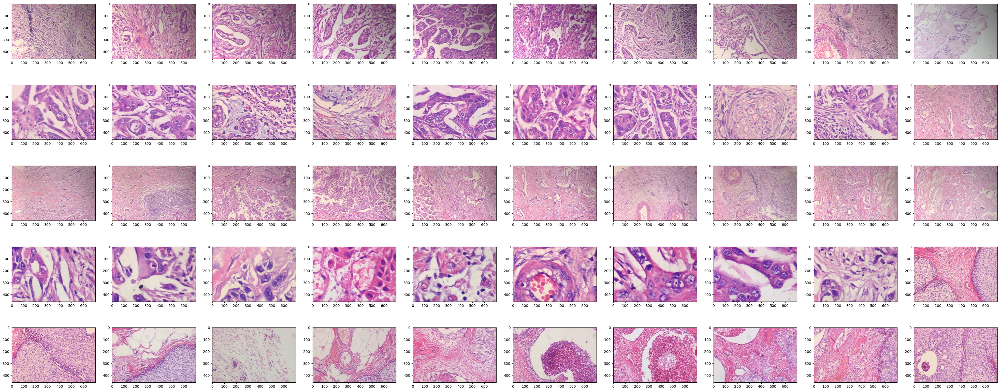

In [16]:
images_index = malignant_df['file_loc'].values
plt.figure(figsize=(50,20))
for i in range(0,50):
    plt.subplot(5,10,i+1)
    img = mpimg.imread("breast_cancer/"+images_index[i])
    plt.imshow(img)

In [17]:
import os
df = pd.DataFrame(os.listdir('breast_cancer/'))
df = df.rename(columns={0:'file_loc'})
df['label'] = df['file_loc'].apply(lambda x: x.split('_')[0])
df['class'] = df['label'].apply(lambda x: 0 if x=='benign' else 1)
df.set_index('file_loc', inplace=True)

In [18]:
df.head()

,label,class
file_loc,,
benign_SOB_B_A-14-22549AB-100-001.png,benign,0
benign_SOB_B_A-14-22549AB-100-002.png,benign,0
benign_SOB_B_A-14-22549AB-100-003.png,benign,0
benign_SOB_B_A-14-22549AB-100-004.png,benign,0
benign_SOB_B_A-14-22549AB-100-005.png,benign,0


In [19]:
# Splitting the data into training (80%), validation (10%) and testing (10%)

from sklearn.model_selection import train_test_split

data_train_val, data_test = train_test_split(df, test_size = 0.1, random_state=0)
data_train, data_val = train_test_split(data_train_val, test_size=1/9, random_state=0)

In [20]:
print("Training size :", data_train.shape)
print("Validation size :", data_val.shape)
print("Testing size :", data_test.shape)

Training size : (6327, 2)
Validation size : (791, 2)
Testing size : (791, 2)


Text(0.5, 1.0, 'Testing set')

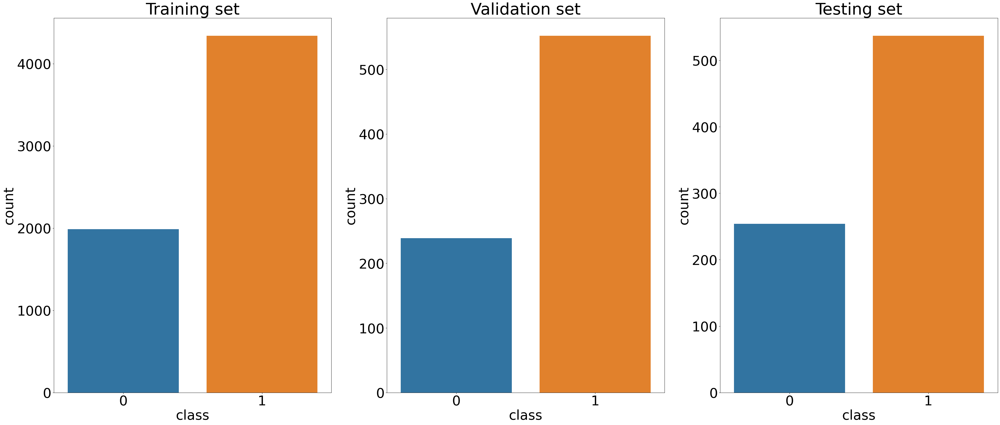

In [21]:
plt.rcParams.update({'font.size': 40})

plt.figure(figsize=(50,20))
plt.subplot(1,3,1)
sns.countplot(x='class', data=data_train)
plt.title("Training set")
plt.subplot(1,3,2)
sns.countplot(x='class', data=data_val)
plt.title("Validation set")
plt.subplot(1,3,3)
sns.countplot(x='class', data=data_test)
plt.title("Testing set")

In [22]:
#Separating the benign and malignant patients from train data
train_has_cancer = data_train[data_train['class'] == 1]
train_has_no_cancer = data_train[data_train['class'] == 0]

In [23]:
train_has_cancer.shape

(4340, 2)

In [24]:
train_has_no_cancer.shape

(1987, 2)

In [25]:
# Upscaling minority class for data balance

from sklearn.utils import resample
train_has_no_cancer_upsample = resample(train_has_no_cancer, n_samples = len(train_has_cancer))

In [26]:
data_train = pd.concat([train_has_cancer, train_has_no_cancer_upsample])

Text(0.5, 1.0, 'Testing set')

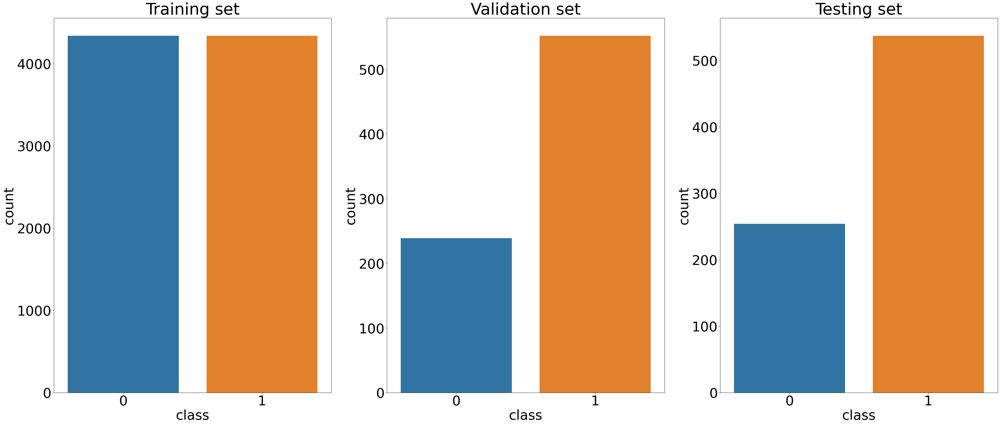

In [27]:
plt.rcParams.update({'font.size': 40})

plt.figure(figsize=(50,20))
plt.subplot(1,3,1)
sns.countplot(x='class', data=data_train)
plt.title("Training set")
plt.subplot(1,3,2)
sns.countplot(x='class', data=data_val)
plt.title("Validation set")
plt.subplot(1,3,3)
sns.countplot(x='class', data=data_test)
plt.title("Testing set")

In [28]:
import os
os.makedirs("Cancer_train/benign")
os.makedirs("Cancer_train/malignant")
os.makedirs("Cancer_validation/benign")
os.makedirs("Cancer_validation/malignant")
os.makedirs("Cancer_test/benign")
os.makedirs("Cancer_test/malignant")

'import os\nos.makedirs("Cancer_train/benign")\nos.makedirs("Cancer_train/malignant")\nos.makedirs("Cancer_validation/benign")\nos.makedirs("Cancer_validation/malignant")\nos.makedirs("Cancer_test/benign")\nos.makedirs("Cancer_test/malignant")\n'

In [29]:
import numpy as np

#Training data
i = 1
for img in data_train.index:
    if img!=".DS_Store":
        target = df.loc[img,'class']
        if target == 1:
            label = 'malignant'
        else:          
            label = 'benign'      
        src = os.path.join("breast_cancer/",img)
        dest = os.path.join("Cancer_train/",label, "image"+str(i)+".png")
        img1 = np.array(mpimg.imread(src))
        plt.imsave(dest,img1)
        i = i+1


'\n#Training data\ni = 1\nfor img in data_train.index:\n    if img!=".DS_Store":\n        target = df.loc[img,\'class\']\n        if target == 1:\n            label = \'malignant\'\n        else:          \n            label = \'benign\'      \n        src = os.path.join("breast_cancer/",img)\n        dest = os.path.join("Cancer_train/",label, "image"+str(i)+".png")\n        img1 = np.array(mpimg.imread(src))\n        plt.imsave(dest,img1)\n        i = i+1\n'

In [30]:
#Validation data
for img in data_val.index:
    target = data_val.loc[img,'class']
    if target == 1:
        label = 'malignant'
    else:
        label = 'benign'
        
    src = os.path.join("breast_cancer/",img)
    dest = os.path.join("Cancer_validation/",label,img)
    img1 = np.array(mpimg.imread(src))
    plt.imsave(dest,img1)

'#Validation data\nfor img in data_val.index:\n    target = data_val.loc[img,\'class\']\n    if target == 1:\n        label = \'malignant\'\n    else:\n        label = \'benign\'\n        \n    src = os.path.join("breast_cancer/",img)\n    dest = os.path.join("Cancer_validation/",label,img)\n    img1 = np.array(mpimg.imread(src))\n    plt.imsave(dest,img1)'

In [31]:
#Testing data
for img in data_test.index:
    target = data_test.loc[img,'class']
    if target == 1:
        label = 'malignant'
    else:
        label = 'benign'
        
    src = os.path.join("breast_cancer/",img)
    dest = os.path.join("Cancer_test/",label,img)
    img1 = np.array(mpimg.imread(src))
    plt.imsave(dest,img1)

'#Testing data\nfor img in data_test.index:\n    target = data_test.loc[img,\'class\']\n    if target == 1:\n        label = \'malignant\'\n    else:\n        label = \'benign\'\n        \n    src = os.path.join("breast_cancer/",img)\n    dest = os.path.join("Cancer_test/",label,img)\n    img1 = np.array(mpimg.imread(src))\n    plt.imsave(dest,img1)'

In [32]:
#Checking their lengths
print("Training Data:")
print(" ")
print("Benign:",len(os.listdir("Cancer_train/benign/")))
print("Malignant::",len(os.listdir("Cancer_train/malignant/")))
print(" ")
print("Validation Data")
print(" ")
print("Benign size:",len(os.listdir("Cancer_validation/benign/")))
print("Malignant size :",len(os.listdir("Cancer_validation/malignant/")))
print(" ")
print("Testing Data:")
print(" ")
print("Benign size :",len(os.listdir("Cancer_test/benign/")))
print("Malignant size :",len(os.listdir("Cancer_test/malignant/")))

Training Data:
 
Benign: 4340
Malignant:: 4340
 
Validation Data
 
Benign size: 239
Malignant size : 552
 
Testing Data:
 
Benign size : 254
Malignant size : 537


Image Dataset

In [33]:
import tensorflow as tf

train_ds = tf.keras.utils.image_dataset_from_directory("Cancer_train/", image_size=(128,128))
val_ds = tf.keras.utils.image_dataset_from_directory("Cancer_validation/", image_size=(128,128))

Found 8680 files belonging to 2 classes.
Found 791 files belonging to 2 classes.


In [34]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [35]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, LeakyReLU

#Defining the base model
cancer_model = tf.keras.Sequential()

#First Layer
cancer_model.add(Conv2D(filters = 32, kernel_size = (3,3), input_shape = (128,128,3)))
cancer_model.add(LeakyReLU())
cancer_model.add(MaxPooling2D(pool_size = (2,2)))

#Second Layer
cancer_model.add(Conv2D(filters = 64, kernel_size = (3,3), padding = 'same'))
cancer_model.add(LeakyReLU())
cancer_model.add(MaxPooling2D(pool_size = (2,2)))

#Third Layer
cancer_model.add(Conv2D(filters = 128, kernel_size = (3,3), padding = 'same'))
cancer_model.add(LeakyReLU())
cancer_model.add(MaxPooling2D(pool_size = (2,2)))
cancer_model.add(Dropout(0.4))

#Fourth Layer
cancer_model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = 'same'))
cancer_model.add(LeakyReLU())
cancer_model.add(MaxPooling2D(pool_size = (2,2)))
cancer_model.add(Dropout(0.2))

#Flattening the layers
cancer_model.add(Flatten())

#Adding the dense layer
cancer_model.add(Dense(256))
cancer_model.add(LeakyReLU())
cancer_model.add(Dense(128))
cancer_model.add(LeakyReLU())
cancer_model.add(Dense(1, activation = 'sigmoid'))

cancer_model.build((None,128,128,3))
cancer_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 126, 126, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 63, 63, 64)        18496     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 63, 63, 64)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 31, 31, 64)       0         
 2D)                                                    

In [36]:
#Setting the learning rate to reduce gradually over the training period
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.001,
  decay_steps=20*50,
  decay_rate=1)

def get_optimizer():
  return tf.keras.optimizers.Adam(lr_schedule)

Model Compilation

Model is compiled by using binary crossentropy as the loss function and adam optimizer to optimize the weights.
Early stopping is involved to monitor validation loss inorder to prevent overfitting with patience level = 5
Modelcheckpoint is used to store the best models for every epoch.

In [37]:
#Compiling the model

cancer_model.compile(loss='binary_crossentropy', optimizer = get_optimizer(), metrics = ['accuracy'])
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5)
checkpoint = tf.keras.callbacks.ModelCheckpoint(
        "Best_model.h5",
        monitor="val_accuracy",
        save_best_only=True,
        mode='max',
        verbose=1)

In [38]:
#Model is fitted using train and validation generator for 20 epochs
history = cancer_model.fit(train_ds, validation_data=val_ds, batch_size = 32, epochs=200, callbacks=[early_stop,checkpoint], verbose = 1)

Epoch 1/200
272/272 [==============================] - ETA: 0s - loss: 8.3869 - accuracy: 0.6824
Epoch 1: val_accuracy improved from -inf to 0.58281, saving model to Best_model.h5
272/272 [==============================] - 244s 868ms/step - loss: 8.3869 - accuracy: 0.6824 - val_loss: 1.6766 - val_accuracy: 0.5828
Epoch 2/200
272/272 [==============================] - ETA: 0s - loss: 0.5670 - accuracy: 0.7482
Epoch 2: val_accuracy improved from 0.58281 to 0.69785, saving model to Best_model.h5
272/272 [==============================] - 81s 298ms/step - loss: 0.5670 - accuracy: 0.7482 - val_loss: 4.4797 - val_accuracy: 0.6979
Epoch 3/200
272/272 [==============================] - ETA: 0s - loss: 0.5279 - accuracy: 0.7609
Epoch 3: val_accuracy did not improve from 0.69785
272/272 [==============================] - 82s 303ms/step - loss: 0.5279 - accuracy: 0.7609 - val_loss: 0.7778 - val_accuracy: 0.5499
Epoch 4/200
272/272 [==============================] - ETA: 0s - loss: 0.4710 - accura

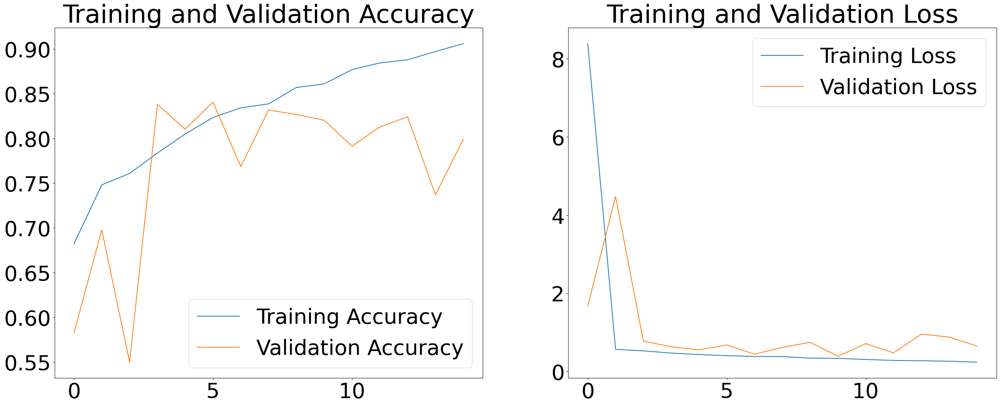

In [39]:
#Plotting the model results

#Getting the accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

#Getting the losses
loss = history.history['loss']
val_loss = history.history['val_loss']

#No of epochs it trained
epochs_range = history.epoch

#Plotting Training and Validation accuracy
plt.figure(figsize=(32, 12))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

#Plotting Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()